# Cluster Blurr Hypothesis Exploration

**Tyler Biggs**  
3/7/2019  
Ficklin Laboratory

---



## Imports

In [3]:
import numpy as np
import pandas as pd
import xarray as xr
import umap
import hdbscan
from sklearn.preprocessing import quantile_transform
from boruta import boruta_py
from sklearn.ensemble import RandomForestClassifier
import holoviews as hv

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
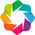

In [4]:
# Notebook specific imports.
hv.extension('bokeh')

## Data Path and Global Settings

In [5]:
gem_path = "/scidas/osativa_heat_drought/02-create_GEM/01-Kamiak_GEM/GEM-log-no.txt"
gem_label_path = "/scidas/osativa_heat_drought/01-input_data/rice_PRJNA301554.sample_annots.txt"
RS = 42
# Holoviews plotting options.
hv_opts = {}
hv_opts['padding'] = 0.1
hv_opts['width'] = 600
hv_opts['height'] = 400
hv_opts['cmap'] = 'rainbow'
hv_opts['xaxis'] = None
hv_opts['yaxis'] = None

## Load Data

*This can take some time.*

In [6]:
%%time
gem_df = pd.read_csv(gem_path, index_col=0, sep='\t').apply(np.exp2).fillna(0).T
# Declare an index name so it matches the (future) label data frame.
gem_df.index.rename('Sample')
label_df = pd.read_csv(gem_label_path, index_col=0, sep='\t')

CPU times: user 8.85 s, sys: 690 ms, total: 9.54 s
Wall time: 8.39 s


*This can take some time as well.*

In [7]:
%%time
nxdf = pd.DataFrame(quantile_transform(gem_df),
                    columns=gem_df.columns, index=gem_df.index)

CPU times: user 1min 51s, sys: 1.6 s, total: 1min 52s
Wall time: 1min 52s


## Conver to `xarray` objects

For labeled `numpy.array()` objects.

In [8]:
%%time
gem_xr = xr.DataArray(gem_df, dims=['Sample', 'Genes'])
norm_gem_xr = xr.DataArray(nxdf, dims=['Sample', 'Genes'])

gem_data_dict = {'gem': gem_xr, 'q_norm_gem': norm_gem_xr}

for col in label_df:
    # Create a DataArray for each column of the labels.
    gem_data_dict[col] = xr.DataArray(label_df[col])

gem_ds = xr.Dataset(gem_data_dict)

CPU times: user 22.6 ms, sys: 0 ns, total: 22.6 ms
Wall time: 21.4 ms


# Create UMAP Embedding

I will end up using (and re-using) more than one umap model. So lets store them in a dictionary.

In [ ]:
%%time
UMAP_Models = {
    'Input Model': umap.UMAP(n_components=2, random_state=RS, 
                             n_neighbors=200).fit(gem_ds['q_norm_gem'])
}

In [ ]:
def build_plotting_df(gem_data_array: xr.DataArray,
                      reduction_model: umap.UMAP,
                      label_dataframe: pd.DataFrame) -> pd.DataFrame:
    """Helper function to create a Holoviews dataset for use in plotting."""
    transform = reduction_model.transform(gem_data_array)
    embedding = pd.DataFrame(transform, index=nxdf.index, columns=['x', 'y'])
    df = pd.concat([embedding, label_dataframe], axis=1, sort=False).reset_index()
    return df

In [ ]:
input_hvds = build_plotting_df(gem_ds['q_norm_gem'], UMAP_Models['Input Model'], label_df)

In [ ]:
input_hvds.head(2)

In [ ]:
def create_figure(labeled_embeddings: pd.DataFrame, group: str):
    kdims = ['x', 'y']
    vdims = ['Subspecies', 'Genotype', 'Treatment']
    points = []
    points = hv.Points(labeled_embeddings, kdims=kdims, vdims=vdims).groupby(group)
    return points

In [ ]:
create_figure(input_hvds, 'Subspecies').opts(plot=hv_opts).overlay()

# Select Features with BorutaPy

In [ ]:
def select_features(data, labels):
    # Define the model which will provide feature rankings to boruta.
    clf_model = RandomForestClassifier(random_state=rs)

    # Create the boruta feature selection object.
    feat_selector = boruta_py.BorutaPy(estimator=clf_model,
                                       n_estimators='auto', alpha=0.05,
                                       verbose=2, random_state=rs)
    feat_selector.fit(data, labels)
    output = dict(ranks=feat_selector.ranking_, support=feat_selector.support_)
    return pd.DataFrame(output)

In [ ]:
%%time
sel_df = select_features(nxdf.values, label_df['Genotype'].values)

In [ ]:
top_tier = sel_df[sel_df['ranks'] == 1]
top_tier.shape

In [ ]:
top_tier.head(2)

# Blur Features Identified by BorutaPy

In [ ]:
# Get those indexes that match.
top_genes = nxdf.iloc[:, top_tier.index]
top_genes.shape

In [ ]:
# with open('rice_top_genes.txt', 'w') as file:
#     text = '\n'.join(list(top_genes.columns))
#     file.write(text)

In [ ]:
gem_df.head()

In [ ]:
# gem_df['ChrUn.fgenesh.mRNA.20']

In [ ]:
condition = label_df['Genotype'] == 'AZ'
condition.shape

In [ ]:
blur_gem_df = gem_df.copy()

means = gem_df.loc[condition, top_genes.columns].mean(0)
stds = gem_df.loc[condition, top_genes.columns].std(0)

for col, mean, std in zip(top_genes.columns, means, stds):
    blur_gem_df.loc[:, col] = mean + np.random.normal(scale=std)

In [ ]:
# gem_df.loc[:, top_genes.columns].std(0)

In [ ]:
# blur_gem_df.head()

In [ ]:
embedding = pd.DataFrame(reducer.transform(blur_gem_df.values), index=blur_gem_df.index,
                         columns=['x', 'y'])
df = pd.concat([embedding, label_df], axis=1, sort=False)

In [ ]:
umap_points(df, 'Treatment').opts(padding=0.1)

In [ ]:
# Fit the reducer on the blurred set.
reducer = umap.UMAP(n_components=2, random_state=rs, n_neighbors=200).fit(blur_gem_df)
embedding = pd.DataFrame(reducer.transform(blur_gem_df.values), index=blur_gem_df.index,
                         columns=['x', 'y'])
df = pd.concat([embedding, label_df], axis=1, sort=False)
upoints = {key: umap_points(df, key) for key in ['Subspecies', 'Treatment', 'Genotype']}
hv.HoloMap(upoints, kdims='Group').opts(padding=0.1)

# Fuzzy Simplicial Set

In [9]:
%%time
fuzzy_graph = umap.umap_.fuzzy_simplicial_set(
    X=gem_ds['q_norm_gem'].values,
    n_neighbors=200,
    metric='manhattan',
    random_state=np.random.RandomState(),
)

CPU times: user 1min 13s, sys: 627 ms, total: 1min 14s
Wall time: 1min 14s


In [10]:
fuzzy_df = pd.DataFrame(fuzzy_graph.todense())
fuzzy_df.shape

(462, 462)

In [11]:
fuzzy_df.head(2)

,0,1,2,3,4,5,6,7,8,9,...,452,453,454,455,456,457,458,459,460,461
0,0.000000,0.002577,0.606060,0.666671,0.563210,0.462143,1.000000,0.159161,0.878163,0.868026,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000195,0.0
1,0.002577,0.000000,0.018732,0.066412,0.008828,0.000266,0.004276,0.000000,0.000000,0.001202,...,0.0,0.000625,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [148]:
fuzzy_edges = pd.DataFrame(fuzzy_df.stack()).reset_index()
fuzzy_edges.columns = ['source', 'target', 'weight']
fuzzy_edges.head(2)

,source,target,weight
0,0,0,0.000000
1,0,1,0.002577


In [149]:
fuzzy_edges.shape

(213444, 3)

In [150]:
nodes = pd.DataFrame(gem_ds['Sample'].values, columns=['name'])
nodes.head(2)

,name
0,SRR2931040
1,SRR2931041


In [151]:
import datashader as ds
import datashader.transfer_functions as tf
from datashader.layout import random_layout, circular_layout, forceatlas2_layout
from datashader.bundling import connect_edges, hammer_bundle

import holoviews.operation.datashader as hd

In [152]:
def nodesplot(nodes, name=None, canvas=None, cat=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    aggregator=None if cat is None else ds.count_cat(cat)
    agg=canvas.points(nodes,'x','y',aggregator)
    return tf.spread(tf.shade(agg, cmap=["#FF3333"]), px=3, name=name)

In [153]:
def edgesplot(edges, name=None, canvas=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    return tf.shade(canvas.line(edges, 'x','y', agg=ds.count()), name=name)

def graphplot(nodes, edges, name="", canvas=None, cat=None):
    if canvas is None:
        xr = nodes.x.min(), nodes.x.max()
        yr = nodes.y.min(), nodes.y.max()
        canvas = ds.Canvas(x_range=xr, y_range=yr, **cvsopts)

    np = nodesplot(nodes, name + " nodes", canvas, cat)
    ep = edgesplot(edges, name + " edges", canvas)
    return tf.stack(ep, np, how="over", name=name)

In [154]:
cvsopts = dict(plot_height=400, plot_width=400)

In [155]:
%%time
forcedirected = forceatlas2_layout(nodes, fuzzy_edges)

CPU times: user 2.76 s, sys: 83.6 ms, total: 2.84 s
Wall time: 2.84 s


In [156]:
# tf.Images(nodesplot(forcedirected, "ForceAtlas2 layout"))

In [157]:
cutoff = fuzzy_edges['weight'].quantile(.95)
filtered = fuzzy_edges[fuzzy_edges['weight'] > cutoff]
filtered.shape

(10672, 3)

In [158]:
# %%time
# graphplot(forcedirected, connect_edges(forcedirected, filtered), "Force-directed, bundled")

CPU times: user 16.9 s, sys: 576 ms, total: 17.5 s
Wall time: 16.9 s


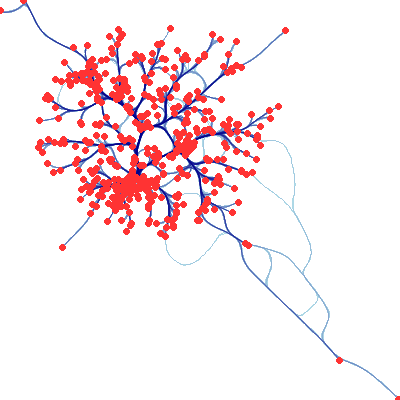

In [159]:
%%time
graphplot(forcedirected, hammer_bundle(forcedirected, filtered), "Force-directed, bundled")

In [160]:
# label_df['Treatment'].values

In [161]:
cnodes = nodes.copy()
cnodes['Treatment'] = label_df['Treatment'].values
cnodes['Treatment'] = cnodes['Treatment'].astype('category')
cnodes.head(2)

,name,Treatment
0,SRR2931040,CONTROL
1,SRR2931041,CONTROL


In [162]:
%%time
fd = forceatlas2_layout(cnodes, filtered)

CPU times: user 1.44 s, sys: 84 ms, total: 1.52 s
Wall time: 1.42 s


/home/tyler/anaconda3/lib/python3.7/site-packages/datashader/utils.py:348: FutureWarning: `Series.cat.categorical` has been deprecated. Use the attributes on 'Series.cat' directly instead.
  ordered=col.cat.categorical.ordered)


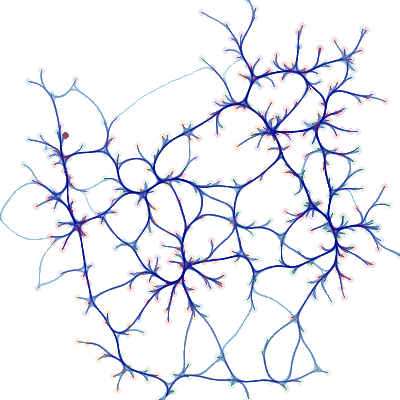

In [163]:
graphplot(fd, hammer_bundle(fd, filtered), "Treatment, bundled",
          cat="Treatment")

In [164]:
cnodes2 = label_df.astype('category').reset_index().drop('Sample', axis=1)
cnodes2.head(2)

,Treatment,Time,Tissue,Genotype,Subspecies
0,CONTROL,15,leaf,AZ,Japonica
1,CONTROL,15,leaf,AZ,Japonica


In [165]:
%%time
fd2 = forceatlas2_layout(cnodes2, filtered)

CPU times: user 1.42 s, sys: 0 ns, total: 1.42 s
Wall time: 1.42 s


In [166]:
fd2.head(2)

,Treatment,Time,Tissue,Genotype,Subspecies,x,y
0,CONTROL,15,leaf,AZ,Japonica,0.577352,0.636198
1,CONTROL,15,leaf,AZ,Japonica,0.621015,0.530740


/home/tyler/anaconda3/lib/python3.7/site-packages/datashader/utils.py:348: FutureWarning: `Series.cat.categorical` has been deprecated. Use the attributes on 'Series.cat' directly instead.
  ordered=col.cat.categorical.ordered)


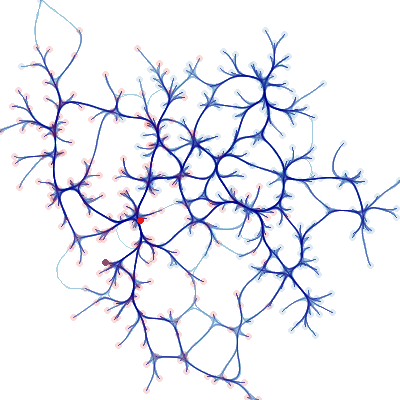

In [167]:
graphplot(fd2, hammer_bundle(fd2, filtered), "Treatment, bundled",
          cat="Subspecies")

/home/tyler/anaconda3/lib/python3.7/site-packages/datashader/utils.py:348: FutureWarning: `Series.cat.categorical` has been deprecated. Use the attributes on 'Series.cat' directly instead.
  ordered=col.cat.categorical.ordered)


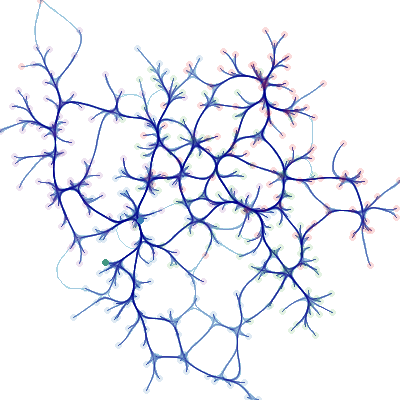

In [168]:
graphplot(fd2, hammer_bundle(fd2, filtered), "Treatment, bundled",
          cat="Genotype")

In [169]:
labels = label_df.astype('object').reset_index()
# labeled_nodes = forceatlas2_layout(labels, filtered)
labels.head(2)

,Sample,Treatment,Time,Tissue,Genotype,Subspecies
0,SRR2931040,CONTROL,15,leaf,AZ,Japonica
1,SRR2931041,CONTROL,15,leaf,AZ,Japonica


In [170]:
%%time
fd3 = forceatlas2_layout(labels, filtered, iterations=100)

CPU times: user 13.8 s, sys: 13.5 ms, total: 13.8 s
Wall time: 13.8 s


In [171]:
fd3.head(2)

,Sample,Treatment,Time,Tissue,Genotype,Subspecies,x,y
0,SRR2931040,CONTROL,15,leaf,AZ,Japonica,0.884417,0.383349
1,SRR2931041,CONTROL,15,leaf,AZ,Japonica,0.568990,0.569465


In [172]:
fd3.dtypes

Sample         object
Treatment      object
Time           object
Tissue         object
Genotype       object
Subspecies     object
x             float32
y             float32
dtype: object

In [173]:
vdims = ['Sample', 'Treatment', 'Genotype', 'Subspecies', 'Time']
hv_nodes = hv.Nodes(fd3, kdims=['x', 'y', 'index'], vdims=vdims).opts(
    padding=0.2, width=600, height=600, size=10)
hv_nodes

:Nodes   [x,y,index]   (Sample,Treatment,Genotype,Subspecies,Time)

In [174]:
hv_nodes.vdims

[Dimension('Sample'),
 Dimension('Treatment'),
 Dimension('Genotype'),
 Dimension('Subspecies'),
 Dimension('Time')]

In [175]:
hvg = hv.Graph((filtered, hv_nodes)).opts(node_color=hv.dim('Treatment'), cmap='Set1', padding=0.2, width=800, height=800, node_size=8,
        edge_line_width=0.1)
hvg

:Graph   [source,target]   (weight)

In [176]:
hd.datashade(hd.bundle_graph(hvg)) * hvg.nodes

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Nodes.I :Nodes   [x,y,index]   (Sample,Treatment,Genotype,Subspecies,Time)

In [177]:
hvg.vdims

[Dimension('weight')]

In [178]:
%%time
bundled = hd.bundle_graph(hvg)

CPU times: user 12.2 s, sys: 58.2 ms, total: 12.3 s
Wall time: 12.2 s


In [179]:
(hd.datashade(bundled, normalization='linear', width=800, height=800) * bundled.nodes).opts(
hv.opts.Nodes(color='Subspecies', size=10, width=1000, cmap='Set1', legend_position='right'))

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Nodes.I :Nodes   [x,y,index]   (Sample,Treatment,Genotype,Subspecies,Time)

In [180]:
(hd.datashade(bundled, normalization='linear', width=800, height=800) * bundled.nodes).opts(
hv.opts.Nodes(color='Genotype', size=10, width=1000, cmap='Set1', legend_position='right'))

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Nodes.I :Nodes   [x,y,index]   (Sample,Treatment,Genotype,Subspecies,Time)

In [181]:
(hd.datashade(bundled, normalization='linear', width=800, height=800) * bundled.nodes).opts(
hv.opts.Nodes(color='Treatment', size=10, width=1000, cmap='Set1', legend_position='left'))

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Nodes.I :Nodes   [x,y,index]   (Sample,Treatment,Genotype,Subspecies,Time)

In [183]:
hd.datashade(hd.bundle_graph(hvg)).opts(width=1000, height=1000)

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

## Scale free network?